# Library

In [1]:
#Library
import sys
import os
import os.path as pth

#!pip install torchplot
import torch
import torchplot as plt
import torch.nn as nn
import torch.optim as optim
import torch.backends.cudnn as cudnn

import numpy as np
import argparse
import pickle
import random
import itertools
import math
from tqdm import tqdm

import nets
import datasets
import tools
import layers as L
import train

from io import BytesIO
from datetime import datetime
from pytz import timezone
from slacker import Slacker

from quantization import *

import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import math

from numba import jit

import warnings
warnings.simplefilter("ignore")

In [2]:
get_bin = lambda x, n: format(x, 'b').zfill(n).replace("-","1")

# Load the model

In [3]:
file = open('latest.txt' , 'r' )
line = file.readline()
pretrained_checkpoint = line
file.close()

# Default settings for arch, dataset, and checkpoint
arch = "CNN_627_large"
dataset = "cifar10"
batch_size = 256
pretrained_checkpoint = pretrained_checkpoint

trainloader, _, testloader = datasets.get_mnist(batch_size)
model = nets.mnist_quant()

pretrained_ckpt = torch.load(pretrained_checkpoint)
model.load_state_dict(pretrained_ckpt['state_dict'])
print("########## Loaded checkpoint '{}'".format(pretrained_checkpoint))

Loading MNIST data ... 
Quant MNIST
########## Loaded checkpoint './checkpoints_quant/mnist_quant_mnist/2_18_Time_16_36/checkpoint_7_98.3.tar'


# Save the data

## Check the data

In [4]:
sum(sum(model.conv1.weight == quant_signed_05(model.conv1.weight)))

tensor([[32, 32, 32],
        [32, 32, 32],
        [32, 32, 32]])

# Start to save data - 5bit quantization

## Save the weights - Seperate file

### Save weight of first conv

In [388]:
file = open('./data_extracted/conv1_weight.txt','w')

a_original = quant_signed_05(model.conv1.weight)
a = a_original
a = a.detach().numpy()
a = a * 16
#print(a.shape)
#print(a[0])
for d in range(a.shape[1]):
    for f in range(a.shape[0]):
        # c = a[f,d]
        # print(c)
        # print("[%d, %d]", f,d)
        for i in range(3):
            for j in range(3):
                # print(c[i,j])
                # print(get_bin(int(c[i,j]),5))
                file.write(get_bin(int(a[f,d,i,j]),5)+"\n")
                # pass
file.close()

### Save weight of second conv

In [71]:
file = open('./data_extracted/conv2_weight.txt','w')

a_original = quant_signed_05(model.conv2.weight)
a = a_original
a = a.detach().numpy()
a = a * 16
#print(a.shape)
#print(a[0])
for d in range(a.shape[1]):
    for f in range(a.shape[0]):
        # c = a[f,d]
        # print(c)
        # print("[%d, %d]", f,d)
        for i in range(3):
            for j in range(3):
                # print(c[i,j])
                # print(get_bin(int(c[i,j]),5))
                file.write(get_bin(int(a[f,d,i,j]),5)+"\n")
                # pass
file.close()

### Save weight of thrid conv

In [70]:
file = open('./data_extracted/conv3_weight.txt','w')

a_original = quant_signed_05(model.conv3.weight)
a = a_original
a = a.detach().numpy()
a = a * 16
#print(a.shape)
#print(a[0])
for d in range(a.shape[1]):
    for f in range(a.shape[0]):
        # c = a[f,d]
        # print(c)
        # print("[%d, %d]", f,d)
        for i in range(3):
            for j in range(3):
                # print(c[i,j])
                # print(get_bin(int(c[i,j]),5))
                file.write(get_bin(int(a[f,d,i,j]),5)+"\n")
                # pass
file.close()

### Save weight of fourth conv

In [69]:
file = open('./data_extracted/conv4_weight.txt','w')

a_original = quant_signed_05(model.conv4.weight)
a = a_original
a = a.detach().numpy()
a = a * 16
#print(a.shape)
#print(a[0])
for d in range(a.shape[1]):
    for f in range(a.shape[0]):
        # c = a[f,d]
        # print(c)
        # print("[%d, %d]", f,d)
        for i in range(3):
            for j in range(3):
                # print(c[i,j])
                # print(get_bin(int(c[i,j]),5))
                file.write(get_bin(int(a[f,d,i,j]),5)+"\n")
                # pass
file.close()

## Save the biases

### Save bias of first conv

In [101]:
a_original = quant_signed_05(model.conv1.bias)
a_original = model.conv1.bias
a = a_original
a = a.detach().numpy()
print(a_original*16)
print(a*16)

tensor([ -2., -11.,  -6., -11.,  -6.,  -3.,  -8.,  -9., -11.,  -7.,  -9.,  -7.,
        -11., -13.,  -4.,  -8., -10.,  -4.,  -4., -10., -13., -15., -15.,  -8.,
         -7.,  -9.,  -8.,  -6.,  -8.,  -7., -10., -10.],
       grad_fn=<MulBackward0>)
[ -2. -11.  -6. -11.  -6.  -3.  -8.  -9. -11.  -7.  -9.  -7. -11. -13.
  -4.  -8. -10.  -4.  -4. -10. -13. -15. -15.  -8.  -7.  -9.  -8.  -6.
  -8.  -7. -10. -10.]


In [389]:
file = open('./data_extracted/conv1_bias.txt','w')

a_original = quant_signed_05(model.conv1.bias)
a = a_original
a = a * 16
print(a_original)
print(a)
for i in a:
    file.write(get_bin(int(i),5)+"\n")
file.close()

tensor([-0.1250, -0.6875, -0.3750, -0.6875, -0.3750, -0.1875, -0.5000, -0.5625,
        -0.6875, -0.4375, -0.5625, -0.4375, -0.6875, -0.8125, -0.2500, -0.5000,
        -0.6250, -0.2500, -0.2500, -0.6250, -0.8125, -0.9375, -0.9375, -0.5000,
        -0.4375, -0.5625, -0.5000, -0.3750, -0.5000, -0.4375, -0.6250, -0.6250])
tensor([ -2., -11.,  -6., -11.,  -6.,  -3.,  -8.,  -9., -11.,  -7.,  -9.,  -7.,
        -11., -13.,  -4.,  -8., -10.,  -4.,  -4., -10., -13., -15., -15.,  -8.,
         -7.,  -9.,  -8.,  -6.,  -8.,  -7., -10., -10.])


### Save bias of second conv

In [89]:
file = open('./data_extracted/conv2_bias.txt','w')

a_original = quant_signed_05(model.conv2.bias)
a = a_original
a = a * 16
print(a_original)
print(a)
for i in a:
    file.write(get_bin(int(i),5)+"\n")
file.close()

tensor([-0.1250, -0.0625,  0.1250,  0.0000, -0.1250, -0.1250, -0.0625, -0.1250,
         0.0000, -0.1250, -0.3750, -0.1250,  0.0000, -0.0625,  0.1250, -0.1875,
        -0.1250,  0.0000, -0.1250, -0.1250,  0.0000, -0.2500,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000, -0.1250, -0.1250, -0.1250, -0.1875, -0.1875,
        -0.1875, -0.6250, -0.5000,  0.0000, -0.0625, -0.0625, -0.1250,  0.0625,
        -0.2500, -0.1250, -0.2500, -0.0625,  0.3750, -0.2500,  0.0000, -0.1875,
         0.0000,  0.0000, -0.0625,  0.0000, -0.4375, -0.2500, -0.2500,  0.0000,
        -0.3125,  0.0000, -0.5000, -0.3750, -0.2500, -0.2500, -0.1250, -0.6875])
tensor([ -2.,  -1.,   2.,   0.,  -2.,  -2.,  -1.,  -2.,   0.,  -2.,  -6.,  -2.,
          0.,  -1.,   2.,  -3.,  -2.,   0.,  -2.,  -2.,   0.,  -4.,   0.,   0.,
          0.,   0.,   0.,  -2.,  -2.,  -2.,  -3.,  -3.,  -3., -10.,  -8.,   0.,
         -1.,  -1.,  -2.,   1.,  -4.,  -2.,  -4.,  -1.,   6.,  -4.,   0.,  -3.,
          0.,   0.,  -1.,   0.,  -7.,  

### Save weight of thrid conv

In [90]:
file = open('./data_extracted/conv3_bias.txt','w')

a_original = quant_signed_05(model.conv3.bias)
a = a_original
a = a * 16
print(a_original)
print(a)
for i in a:
    file.write(get_bin(int(i),5)+"\n")
file.close()

tensor([ 0.0000,  0.0000, -0.0625, -0.0625, -0.0625,  0.0000, -0.0625,  0.0000,
        -0.1875,  0.0000,  0.0000, -0.0625, -0.0625,  0.0000, -0.0625, -0.0625,
         0.0625, -0.1250, -0.1875,  0.0000,  0.0000,  0.0000,  0.0000, -0.1250,
        -0.0625, -0.0625, -0.1875,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000, -0.0625,  0.0000,  0.0000, -0.0625,  0.0000,  0.0000,
         0.0000, -0.1250,  0.0000,  0.0000, -0.0625, -0.0625, -0.0625,  0.0000,
         0.0000, -0.0625,  0.0000,  0.0000,  0.0000, -0.0625,  0.0000, -0.0625,
         0.0000, -0.1250, -0.0625,  0.0000,  0.0000, -0.0625,  0.0000,  0.0625,
        -0.0625,  0.0000, -0.1250,  0.0000,  0.0000, -0.1250, -0.1250,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
        -0.0625,  0.0000,  0.0000,  0.0000,  0.0000, -0.0625,  0.0000,  0.1250,
         0.0000, -0.0625,  0.0000, -0.2500,  0.0000,  0.0000,  0.0000, -0.1875,
        -0.0625, -0.0625,  0.0000,  0.00

### Save weight of fourth conv

In [91]:
file = open('./data_extracted/conv4_bias.txt','w')

a_original = quant_signed_05(model.conv4.bias)
a = a_original
a = a * 16
print(a_original)
print(a)
for i in a:
    file.write(get_bin(int(i),5)+"\n")
file.close()

tensor([ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0625,  0.0000,  0.0000,
        -0.0625, -0.0625,  0.0000,  0.0000,  0.0000, -0.0625,  0.0000,  0.0000,
        -0.0625,  0.0000, -0.0625,  0.0000,  0.0000,  0.0000,  0.0000, -0.0625,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
        -0.0625,  0.0000, -0.1875,  0.0000, -0.0625, -0.0625,  0.0000,  0.0000,
        -0.1250,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000, -0.0625, -0.0625, -0.0625,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.1250,
        -0.0625, -0.0625,  0.0625, -0.0625,  0.0000, -0.0625,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
        -0.0625,  0.0000,  0.0000,  0.0000, -0.0625,  0.0000,  0.0000, -0.0625,
         0.0000,  0.0000,  0.0000,  0.00

# Save the weights - continuous

In [147]:
#
file = open('./data_extracted/conv_weight.txt','w')

a_original = quant_signed_05(model.conv1.weight)
a = a_original
a = a.detach().numpy()
a = a * 16
#print(a.shape)
#print(a[0])
for d in range(a.shape[1]):
    for f in range(a.shape[0]):
        # c = a[f,d]
        # print(c)
        # print("[%d, %d]", f,d)
        for i in range(3):
            for j in range(3):
                # print(c[i,j])
                # print(get_bin(int(c[i,j]),5))
                file.write(get_bin(int(a[f,d,i,j]),5)+"\n")
                # pass
                
#file.write(" \n")
a_original = quant_signed_05(model.conv2.weight)
a = a_original
a = a.detach().numpy()
a = a * 16
#print(a.shape)
#print(a[0])
for d in range(a.shape[1]):
    for f in range(a.shape[0]):
        # c = a[f,d]
        # print(c)
        # print("[%d, %d]", f,d)
        for i in range(3):
            for j in range(3):
                # print(c[i,j])
                # print(get_bin(int(c[i,j]),5))
                file.write(get_bin(int(a[f,d,i,j]),5)+"\n")
                # pass
                
#file.write(" \n")
a_original = quant_signed_05(model.conv3.weight)
a = a_original
a = a.detach().numpy()
a = a * 16
#print(a.shape)
#print(a[0])
for d in range(a.shape[1]):
    for f in range(a.shape[0]):
        # c = a[f,d]
        # print(c)
        # print("[%d, %d]", f,d)
        for i in range(3):
            for j in range(3):
                # print(c[i,j])
                # print(get_bin(int(c[i,j]),5))
                file.write(get_bin(int(a[f,d,i,j]),5)+"\n")
                # pass
#file.write(" \n")                
a_original = quant_signed_05(model.conv4.weight)
a = a_original
a = a.detach().numpy()
a = a * 16
#print(a.shape)
#print(a[0])
for d in range(a.shape[1]):
    for f in range(a.shape[0]):
        # c = a[f,d]
        # print(c)
        # print("[%d, %d]", f,d)
        for i in range(3):
            for j in range(3):
                # print(c[i,j])
                # print(get_bin(int(c[i,j]),5))
                file.write(get_bin(int(a[f,d,i,j]),5)+"\n")
                # pass
                
file.close()

# Save the biases - continuous

In [146]:
file = open('./data_extracted/conv_bias.txt','w')

a_original = quant_signed_05(model.conv1.bias)
a = a_original
a = a * 16
for i in a:
    file.write(get_bin(int(i),5)+"\n")
#file.write(" \n")
    
    
a_original = quant_signed_05(model.conv2.bias)
a = a_original
a = a * 16
for i in a:
    file.write(get_bin(int(i),5)+"\n")
#file.write(" \n")

a_original = quant_signed_05(model.conv3.bias)
a = a_original
a = a * 16
for i in a:
    file.write(get_bin(int(i),5)+"\n")
#file.write(" \n")

a_original = quant_signed_05(model.conv4.bias)
a = a_original
a = a * 16
for i in a:
    file.write(get_bin(int(i),5)+"\n")


file.close()

# Preparing Data

## Functions

In [345]:
a = torch.rand(9)
b = torch.rand(9) - 0.7
a = quant_signed_05(a)
b = quant_signed_05(b)

print(a)
print(b)

result = amac(a,b)
print(result)



tensor([0.8750, 0.8750, 0.6250, 0.3125, 0.1250, 0.9375, 0.0000, 0.5000, 0.0625])
tensor([ 0.1875, -0.3125,  0.1875, -0.1875,  0.1875, -0.6250, -0.2500, -0.6250,
        -0.3125])
tensor(-0.9453)


In [352]:
a = torch.tensor([0.8750, 0.8750, 0.6250, 0.3125, 0.1250, 0.9375, 0.0000, 0.5000, 0.0625])
b = torch.tensor([ 0.1875, -0.3125,  0.1875, -0.1875,  0.1875, -0.6250, -0.2500, -0.6250,-0.3125])

In [376]:
result = amac(a,b)
print(result)
dd = quant_signed_15(result)

tensor(-0.945)


In [360]:
sum(a*16 * b*16)

tensor(-242.)

In [378]:
result

tensor(-0.945)

In [379]:
file = open('./data_extracted/amac_result_quant.txt','w')
dd = quant_signed_15(result) * 8
result = dd
print(result)
file.write(get_bin(int(result),5)+"\n")
file.close()

tensor(-7.)


In [346]:
file = open('./data_extracted/amac_input.txt','w')
a = a*16
print(a)
for i in a:
    file.write(get_bin(int(i),5)+"\n")
file.close()

tensor([14., 14., 10.,  5.,  2., 15.,  0.,  8.,  1.])


In [347]:
file = open('./data_extracted/amac_weight.txt','w')
b = b*16
print(b)
for i in b:
    file.write(get_bin(int(i),5)+"\n")
file.close()

tensor([  3.,  -5.,   3.,  -3.,   3., -10.,  -4., -10.,  -5.])


In [404]:
a = torch.tensor([0.9375, 0.6250, 0.6875, 0.3750, 0.1875, 0.1250, 0.5625, 0.9375, 0.6875])
b = torch.tensor([0.6250, 0.3125, 0.9375, 0.3750, 0.5000, 0.8125, 0.4375, 0.6250, 0.9375])
a = quant_signed_05(a)
b = quant_signed_05(b)
result = (a * b).sum()
print(a*16)
print(b*16)

print(result)
print(result*16*16)
print(get_bin(int(result*16*16),14))
print(quant_signed_15(result)*8)

print(get_bin(int(quant_signed_15(result)*8),5))

tensor([15., 10., 11.,  6.,  3.,  2.,  9., 15., 11.])
tensor([10.,  5., 15.,  6.,  8., 13.,  7., 10., 15.])
tensor(3.2383)
tensor(829.)
00001100111101
tensor(15.)
01111


In [406]:
a = torch.rand(9)
b = torch.rand(9) - 0.3
a = quant_signed_15(a)
b = quant_signed_15(b)
result = (a * b).sum()
print(a*16)
print(b*16)

print(result)
print(result*16*16)
print(get_bin(int(result*16*16),14))
print(quant_signed_15(result)*8)

print(get_bin(int(quant_signed_15(result)*8),5))

tensor([ 6., 14., 14.,  4., 12., 14., 10.,  2.,  4.])
tensor([ 0.,  0.,  0.,  0.,  4., 10.,  6.,  8., -4.])
tensor(0.969)
tensor(248.)
00000011111000
tensor(7.)
00111


In [392]:
a = torch.rand(9)
b = torch.rand(9)

result = (a * b).sum()
print(a*16)
print(b*16)

print(result)
print(result*16*16)
print(get_bin(int(result*16*16),14))
print(quant_signed_15(result)*8)

print(get_bin(int(quant_signed_15(result)*8),5))

tensor([ 0.875,  2.279,  3.068,  1.181,  9.893, 12.468,  3.907, 11.948,  1.156])
tensor([13.219,  5.675,  5.031,  4.705,  6.507,  5.313,  4.221,  7.061, 10.339])
tensor(1.129)
tensor(288.910)
00000100100000
tensor(9.)
01001


In [385]:
a = torch.tensor([0.8750, 0.8750, 0.6250, 0.3125, 0.1250, 0.9375, 0.0000, 0.5000, 0.0625])
b = torch.tensor([ 0.1875, -0.3125,  0.1875, -0.1875,  0.1875, -0.6250, -0.2500, -0.6250,-0.3125])
result = (a * b).sum()
print(a*16)
print(b*16)

print(result)
print(result*16*16)
print(get_bin(int(result*16*16),14))
print(quant_signed_15(result)*8)

print(get_bin(int(quant_signed_15(result)*8),5))

tensor([14., 14., 10.,  5.,  2., 15.,  0.,  8.,  1.])
tensor([  3.,  -5.,   3.,  -3.,   3., -10.,  -4., -10.,  -5.])
tensor(-0.945)
tensor(-242.)
10000011110010
tensor(-7.)
10111


In [372]:
result

tensor(-0.945)

In [373]:
file = open('./data_extracted/amac_result.txt','w')
result = result*16*16
file.write(get_bin(int(result),14)+"\n")
file.close()

In [303]:
file = open('./data_extracted/amac_result.txt','r')
a = file.readlines()[0].replace("\n","")
binaryToDecimal(a)


829


In [302]:
def binaryToDecimal(binary):
    if type(binary) != type(int):
        binary = int(binary)
    decimal, i = 0, 0
    while(binary != 0):
        dec = binary % 10
        decimal = decimal + dec * pow(2, i)
        binary = binary//10
        i += 1
    print(decimal)

829


In [ ]:
for d in range(x.shape[0]):
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            file.write(get_bin(int(x[d,i,j]),5)+"\n")
file.close()

## Amac function

In [244]:
a = torch.rand(9)
b = torch.rand(9)
print(a)
def amac(x, w):
    return (x * b).sum()

d = amac(a,b)
d

tensor([0.466, 0.160, 0.671, 0.392, 0.826, 0.081, 0.761, 0.481, 0.710])


tensor(2.455)

In [226]:
def fc(x_original, w, b):
    
    c = x_original * w
    d = torch.zeros(w.shape[0])
    for i in range(w.shape[0]):
        d[i] = c[i].sum()
    return d + b

In [119]:
def conv_custom_old(x_original, w, b):
    m = nn.ConstantPad2d(1, 0)

    x = m(x_original)
    #w = model.conv1.weight

    filt = w.shape[0]
    depth = x_original.shape[0] 
    row = x_original.shape[1]
    col = x_original.shape[2]

    c = torch.zeros(filt,row,col)
    one_layer = torch.zeros(row,col)
    #print(c.shape)
    
    for f in range(filt):
        for d in range(depth):
            for i in range(row):
                for j in range(col):

                    r = x[d,i:i+3,j:j+3] * w[f,d]
                    
                    one_layer[i,j] = (r.sum())
            
            c[f,:,:] = c[f,:,:] + one_layer
            #print(c[f,:,:])
        c[f,:,:] = c[f,:,:] + b[f]
    #print(c.shape)
    return c

## Conv function

In [241]:
a = torch.rand(64,32,32)
b = torch.rand(30)
w = torch.rand(30)

a = pad(a)
print(a)

[[[0.    0.    0.    ... 0.    0.    0.   ]
  [0.    0.369 0.472 ... 0.818 0.913 0.   ]
  [0.    0.696 0.711 ... 0.824 0.123 0.   ]
  ...
  [0.    0.413 0.827 ... 0.959 0.034 0.   ]
  [0.    0.809 0.546 ... 0.617 0.825 0.   ]
  [0.    0.    0.    ... 0.    0.    0.   ]]

 [[0.    0.    0.    ... 0.    0.    0.   ]
  [0.    0.057 0.429 ... 0.224 0.34  0.   ]
  [0.    0.844 0.828 ... 0.983 0.561 0.   ]
  ...
  [0.    0.086 0.186 ... 0.555 0.266 0.   ]
  [0.    0.158 0.146 ... 0.449 0.799 0.   ]
  [0.    0.    0.    ... 0.    0.    0.   ]]

 [[0.    0.    0.    ... 0.    0.    0.   ]
  [0.    0.725 0.284 ... 0.596 0.995 0.   ]
  [0.    0.153 0.025 ... 0.401 0.275 0.   ]
  ...
  [0.    0.432 0.897 ... 0.842 0.023 0.   ]
  [0.    0.958 0.351 ... 0.141 0.269 0.   ]
  [0.    0.    0.    ... 0.    0.    0.   ]]

 ...

 [[0.    0.    0.    ... 0.    0.    0.   ]
  [0.    0.379 0.975 ... 0.169 0.156 0.   ]
  [0.    0.231 0.964 ... 0.47  0.892 0.   ]
  ...
  [0.    0.341 0.61  ... 0.478 0.79  0. 

In [246]:
t = torch.from_numpy(a)

In [329]:
@jit(nopython=True)
def conv_custom_fa(x_original, w, b):
   
    filt = w.shape[0]
    depth = x_original.shape[0] 
    row = x_original.shape[1] - 2
    col = x_original.shape[2] - 2

    c = np.zeros((filt,row,col))
    one_layer = np.zeros((row,col))
    
    for f in range(filt):
        for i in range(row):
            for j in range(col):
                r = x_original[:,i:i+3,j:j+3] * w[f]
                re = 0
                for d1 in range(depth):
                    partial_sum = r[d1].sum()
                    re = re + partial_sum
                one_layer[i,j] = re
        c[f,:,:] = quant_signed_15_np(one_layer + b[f])
    return c
@jit(nopython=True)
def quant_signed_15_np(original, bit=5):
    bit = bit -2
    np.clip(original, 1.875, -1.875)
    original = original * (2**bit)
    (row, col) = original.shape
    result = np.zeros((row,col))
    for i in range(row):
        for j in range(col):
            result[i,j] = math.trunc(original[i,j])/ (2**bit)

    return result

def reul(x):
    return np.maximum(0,x)

def padding(a):
    result = np.zeros((a.shape[0],a.shape[1]+2,a.shape[2]+2))
    for i in range(a.shape[0]):
        result[i] = np.pad(a[i],1)
    return result

@jit(nopython=True)
def maxpooling(x_original):
   
    depth = x_original.shape[0] 
    row = int((x_original.shape[1])/2)
    col = int((x_original.shape[2])/2)

    one_layer = np.zeros((depth,row,col))
    
    for d in range(depth):
        for i in range(row):
            for j in range(col):
                r = x_original[d,2*i:2*i+2,2*j:2*j+2].max()
                one_layer[d,i,j] = r
    return one_layer

In [347]:
x = np.random.rand(1,32,32)
w = np.random.rand(32,3,3)
b = np.random.rand(32)

x = padding(x)
x = conv_custom_fa(x,w,b)
x = maxpooling(x)
x = reul(x)

(1, 32, 32)
(1, 34, 34)
(32, 32, 32)
(32, 16, 16)


(32, 4, 4)
(32, 2, 2)
(32, 1, 1)


In [334]:
x

array([[[ 0.   ,  0.   ,  0.   ],
        [ 0.   ,  8.375,  0.   ],
        [ 0.   ,  0.   ,  0.   ]],

       [[ 0.   ,  0.   ,  0.   ],
        [ 0.   , 10.   ,  0.   ],
        [ 0.   ,  0.   ,  0.   ]],

       [[ 0.   ,  0.   ,  0.   ],
        [ 0.   , 10.25 ,  0.   ],
        [ 0.   ,  0.   ,  0.   ]],

       [[ 0.   ,  0.   ,  0.   ],
        [ 0.   ,  8.375,  0.   ],
        [ 0.   ,  0.   ,  0.   ]],

       [[ 0.   ,  0.   ,  0.   ],
        [ 0.   ,  7.75 ,  0.   ],
        [ 0.   ,  0.   ,  0.   ]],

       [[ 0.   ,  0.   ,  0.   ],
        [ 0.   ,  9.375,  0.   ],
        [ 0.   ,  0.   ,  0.   ]],

       [[ 0.   ,  0.   ,  0.   ],
        [ 0.   ,  9.375,  0.   ],
        [ 0.   ,  0.   ,  0.   ]],

       [[ 0.   ,  0.   ,  0.   ],
        [ 0.   ,  7.125,  0.   ],
        [ 0.   ,  0.   ,  0.   ]],

       [[ 0.   ,  0.   ,  0.   ],
        [ 0.   ,  5.75 ,  0.   ],
        [ 0.   ,  0.   ,  0.   ]],

       [[ 0.   ,  0.   ,  0.   ],
        [ 0.   ,  7.625,  0.  

In [6]:
def conv_custom(x_original, w, b):
   
    m = nn.ConstantPad2d(1, 0)
    x = m(x_original)

    filt = w.shape[0]
    depth = x_original.shape[0] 
    row = x_original.shape[1]
    col = x_original.shape[2]

    c = torch.zeros(filt,row,col)
    one_layer = torch.zeros(row,col)
    result_list = []
    result_list1 = []
    for f in tqdm(range(filt)):
        for i in range(row):
            for j in range(col):
                r = x[:,i:i+3,j:j+3] * w[f]
                #print(r.shape)
                re = 0
                for d1 in range(depth):
                    #print(r[d1].shape)
                    partial_sum = quant_signed_15(r[d1].sum())
                    re = re + partial_sum
                    result_list.append(partial_sum)
                result_list1.append(re)
                one_layer[i,j] = re
        c[f,:,:] = quant_signed_15(one_layer + b[f])
    return c, result_list, result_list1

In [9]:
def conv_custom(x_original, w, b):
   
    m = nn.ConstantPad2d(1, 0)
    x = m(x_original)

    filt = w.shape[0]
    depth = x_original.shape[0] 
    row = x_original.shape[1]
    col = x_original.shape[2]

    c = torch.zeros(filt,row,col)
    one_layer = torch.zeros(row,col)
    for f in tqdm(range(filt)):
        for i in range(row):
            for j in range(col):
                r = x[:,i:i+3,j:j+3] * w[f]
                #print(r.shape)
                re = 0
                for d1 in range(depth):
                    #print(r[d1].shape)
                    partial_sum = quant_signed_15(r[d1].sum())
                    re = re + partial_sum
                    #re = quant_signed_15(re)
                one_layer[i,j] = re
        c[f,:,:] = quant_signed_15(one_layer + b[f])
    return c

In [8]:
def conv_custom_no_bias(x_original, w, b):
   
    m = nn.ConstantPad2d(1, 0)
    x = m(x_original)

    filt = w.shape[0]
    depth = x_original.shape[0] 
    row = x_original.shape[1]
    col = x_original.shape[2]

    c = torch.zeros(filt,row,col)
    one_layer = torch.zeros(row,col)
    
    for f in tqdm(range(filt)):
        for i in range(row):
            for j in range(col):
                r = x[:,i:i+3,j:j+3] * w[f]
                #print(r.shape)
                re = 0
                for d1 in range(depth):
                    #print(r[d1].shape)
                    partial_sum = quant_signed_15(r[d1].sum())
                    re = re + partial_sum
                    #re = quant_signed_15(re)
                one_layer[i,j] = re
        c[f,:,:] = quant_signed_15(one_layer)
    return c

### Function Check

In [315]:
x = x_original
w = model.conv1.weight
b = model.conv1.bias
result1 = conv_custom(x, w, b)
result2 = quant_signed_15(model.conv1(x))

print((result1==result2).sum())

100%|████████████████████████████████████████| 32/32 [00:02<00:00, 12.12it/s]

tensor(23686)


In [233]:
result1

tensor([[[-0.125, -0.125, -0.125,  ..., -0.125, -0.125, -0.125],
         [-0.125, -0.125, -0.125,  ...,  0.000,  0.000, -0.125],
         [-0.125, -0.250, -0.250,  ..., -0.250, -0.250, -0.125],
         ...,
         [-0.125, -0.125, -0.250,  ..., -0.250, -0.125, -0.125],
         [-0.125, -0.125, -0.125,  ...,  0.000,  0.000, -0.125],
         [-0.125, -0.125, -0.125,  ..., -0.125, -0.125, -0.125]],

        [[-0.625, -0.625, -0.625,  ..., -0.625, -0.625, -0.625],
         [-0.625, -0.750, -0.750,  ..., -0.500, -0.500, -0.625],
         [-0.625, -1.000, -0.875,  ..., -0.250, -0.375, -0.625],
         ...,
         [-0.625, -1.000, -1.000,  ..., -0.500, -0.500, -0.625],
         [-0.625, -0.750, -0.875,  ..., -0.625, -0.625, -0.625],
         [-0.625, -0.625, -0.625,  ..., -0.625, -0.625, -0.625]],

        [[-0.375, -0.375, -0.375,  ..., -0.375, -0.375, -0.375],
         [-0.375, -0.375, -0.125,  ...,  0.125, -0.125, -0.375],
         [-0.375, -0.500, -0.500,  ..., -0.125, -0.125, -0

In [229]:
result1 = conv_custom(x, w, b)

100%|████████████████████████████████████████| 32/32 [00:02<00:00, 11.59it/s]


## Load Data

In [313]:
print("mnist dataset")
with open("./data_quantized/quant_data_mnist.pkl","rb") as f:
    data_list = pickle.load(f)
with open("./data_quantized/quant_label_mnist.pkl","rb") as g:
    label_list = pickle.load(g)

mnist dataset


## Save input

In [385]:
file = open('./data_extracted/input.txt','w')
# x_original = torch.randn(1, 32,32)
x_original = data_list[0].view(1,32,32)
print((x_original == quant_signed_15(x_original)).sum())
x_original = quant_signed_15(x_original)

x = x_original
x = x*8
print(x.shape)


for d in range(x.shape[0]):
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            file.write(get_bin(int(x[d,i,j]),5)+"\n")
file.close()

tensor(1024)
torch.Size([1, 32, 32])


In [314]:
x_original.shape

torch.Size([1, 32, 32])

## Save the result of each layer

### Save result of first conv

In [127]:
print("--------------shape----------------")

#result_original = quant_signed_15(model.conv1(x_original))
print(x_original.shape)
x = x_original
w = model.conv1.weight
b = model.conv1.bias
result_original = conv_custom(x, w, b)
result = result_original*8


print(result_original.shape)
print(sum(sum(sum(result >= 16))))

file = open('./data_extracted/output/conv1_output.txt','w')

x = result
for d in range(x.shape[0]):
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            #print(x[d,i,j])
            file.write(get_bin(int(x[d,i,j]),5)+"\n")
file.close()

--------------shape----------------
torch.Size([1, 32, 32])


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [00:09<00:00,  3.43it/s]

torch.Size([32, 32, 32])
tensor(0)


### Save the result of first relu & maxpooling

In [128]:
x = result_original
x = F.relu(x)
x = model.pool2(x)
print(x.shape)
result_original = x
print(x[0])

file = open('./data_extracted/output/pooling1_output.txt','w')

x = result
for d in range(x.shape[0]):
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            #print(x[d,i,j])
            file.write(get_bin(int(x[d,i,j]),5)+"\n")
file.close()

torch.Size([32, 16, 16])
tensor([[0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
         0.000, 0.000, 0.000, 0.000, 0.000, 0.000],
        [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
         0.000, 0.000, 0.000, 0.000, 0.000, 0.000],
        [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
         0.000, 0.000, 0.000, 0.000, 0.000, 0.000],
        [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
         0.000, 0.000, 0.125, 0.000, 0.000, 0.000],
        [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
         0.000, 0.000, 0.000, 0.000, 0.000, 0.000],
        [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
         0.000, 0.000, 0.000, 0.000, 0.000, 0.000],
        [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
         0.000, 0.000, 0.000, 0.000, 0.000, 0.000],
        [0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 

### Save result of second conv

In [129]:
print("--------------shape----------------")
print(result_original.shape)

x_original = result_original
x = x_original
w = model.conv2.weight
b = model.conv2.bias

result_original = conv_custom(x, w, b)
result = result_original*8

print(result_original.shape)
print(sum(sum(sum(result >= 16))))

file = open('./data_extracted/output/conv2_output.txt','w')

x = result
for d in range(x.shape[0]):
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            #print(x[d,i,j])
            file.write(get_bin(int(x[d,i,j]),5)+"\n")
file.close()

--------------shape----------------
torch.Size([32, 16, 16])


100%|██████████████████████████████████████████████████████████████████████████████████| 64/64 [02:05<00:00,  1.96s/it]

torch.Size([64, 16, 16])
tensor(0)


### Save the result of second pooling

In [130]:
print("--------------shape----------------")
print(result_original.shape)
x = result_original
x = F.relu(x)
x = model.pool2(x)
result_original = x
print(result_original.shape)


file = open('./data_extracted/output/pooling2_output.txt','w')
x = result
for d in range(x.shape[0]):
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            #print(x[d,i,j])
            file.write(get_bin(int(x[d,i,j]),5)+"\n")
file.close()

--------------shape----------------
torch.Size([64, 16, 16])
torch.Size([64, 8, 8])


### Save result of thrid conv

In [131]:
print("--------------shape----------------")
print(result_original.shape)

x_original = result_original
x = x_original
w = model.conv3.weight
b = model.conv3.bias

result_original = conv_custom(x, w, b)
result = result_original*8

print(result_original.shape)
print(sum(sum(sum(result >= 16))))

file = open('./data_extracted/output/conv3_output.txt','w')

x = result
for d in range(x.shape[0]):
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            #print(x[d,i,j])
            file.write(get_bin(int(x[d,i,j]),5)+"\n")
file.close()

--------------shape----------------
torch.Size([64, 8, 8])


100%|█████████████████████████████████████████| 128/128 [02:06<00:00,  1.01it/s]

torch.Size([128, 8, 8])
tensor(0)


### Save the result of third pooling

In [132]:
print("--------------shape----------------")
print(result_original.shape)

x = result_original
x = F.relu(x)
x = model.pool2(x)
result_original = x
print(result_original.shape)


file = open('./data_extracted/output/pooling3_output.txt','w')
x = result
for d in range(x.shape[0]):
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            #print(x[d,i,j])
            file.write(get_bin(int(x[d,i,j]),5)+"\n")
file.close()

--------------shape----------------
torch.Size([128, 8, 8])
torch.Size([128, 4, 4])


### Save result of fourth conv

In [133]:
print("--------------shape----------------")

x_original = result_original
x = x_original
w = model.conv4.weight
b = model.conv4.bias

result_original = conv_custom(x, w, b)
result = result_original*8

print(result_original.shape)
print(sum(sum(sum(result >= 16))))

file = open('./data_extracted/output/conv4_output.txt','w')

x = result
for d in range(x.shape[0]):
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            #print(x[d,i,j])
            file.write(get_bin(int(x[d,i,j]),5)+"\n")
file.close()

--------------shape----------------


100%|█████████████████████████████████████████| 256/256 [02:07<00:00,  2.00it/s]

torch.Size([256, 4, 4])
tensor(0)


### Save the result of fourth pooling

In [137]:
print("--------------shape----------------")
print(result_original.shape)

x = result_original
x = F.relu(x)
x = model.pool2(x)
result_original = x
print(result_original.shape)


file = open('./data_extracted/output/pooling4_output.txt','w')
x = result
for d in range(x.shape[0]):
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            #print(x[d,i,j])
            file.write(get_bin(int(x[d,i,j]),5)+"\n")
file.close()

--------------shape----------------
torch.Size([256, 4, 4])
torch.Size([256, 2, 2])


# Get actual data

In [10]:
print("mnist dataset")
with open("./data_quantized/quant_data_mnist.pkl","rb") as f:
    data_list = pickle.load(f)
with open("./data_quantized/quant_label_mnist.pkl","rb") as g:
    label_list = pickle.load(g)

mnist dataset


## Start

In [11]:
y = label_list[0]
x_original = data_list[0].view(1,32,32)
print(y)

x = x_original
y = x_original
print(x.shape)

tensor(5)
torch.Size([1, 32, 32])


In [589]:
x_original[0][7]

tensor([ 0.000,  0.000, -1.000, -1.000, -1.000, -1.000, -1.000, -1.000, -1.000,
        -1.000, -1.000, -1.000, -1.000, -1.000, -0.875, -0.750, -0.750, -0.750,
         0.000,  0.000,  0.250, -0.750,  0.250,  0.875,  0.875,  0.000, -1.000,
        -1.000, -1.000, -1.000,  0.000,  0.000])

## First conv

In [590]:
y = x
x = model.conv1(x)
print(x.shape)
w = model.conv1.weight
b = model.conv1.bias

y, result_list, result_list1 = conv_custom(y, w, b)
sum(sum(x == y))

torch.Size([32, 32, 32])


  0%|                                                 | 0/32 [00:00<?, ?it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

  3%|█▎                                       | 1/32 [00:00<00:08,  3.66it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

  6%|██▌                                      | 2/32 [00:00<00:07,  3.78it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

  9%|███▊                                     | 3/32 [00:00<00:07,  4.07it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 12%|█████▏                                   | 4/32 [00:01<00:10,  2.63it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 16%|██████▍                                  | 5/32 [00:01<00:08,  3.04it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 19%|███████▋                                 | 6/32 [00:01<00:07,  3.39it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 22%|████████▉                                | 7/32 [00:02<00:06,  3.59it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 25%|██████████▎                              | 8/32 [00:02<00:06,  3.71it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 28%|███████████▌                             | 9/32 [00:02<00:06,  3.80it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 31%|████████████▌                           | 10/32 [00:02<00:05,  3.89it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 34%|█████████████▊                          | 11/32 [00:03<00:05,  3.97it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 38%|███████████████                         | 12/32 [00:03<00:04,  4.10it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 41%|████████████████▎                       | 13/32 [00:03<00:04,  4.26it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 44%|█████████████████▌                      | 14/32 [00:03<00:04,  4.35it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 47%|██████████████████▊                     | 15/32 [00:03<00:03,  4.33it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 50%|████████████████████                    | 16/32 [00:04<00:03,  4.08it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 53%|█████████████████████▎                  | 17/32 [00:04<00:03,  3.98it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 56%|██████████████████████▌                 | 18/32 [00:04<00:03,  3.98it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 59%|███████████████████████▊                | 19/32 [00:04<00:03,  3.96it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 62%|█████████████████████████               | 20/32 [00:05<00:03,  3.87it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 66%|██████████████████████████▎             | 21/32 [00:05<00:02,  4.04it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 69%|███████████████████████████▌            | 22/32 [00:05<00:02,  4.06it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 72%|████████████████████████████▊           | 23/32 [00:05<00:02,  4.11it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 75%|██████████████████████████████          | 24/32 [00:06<00:01,  4.13it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 78%|███████████████████████████████▎        | 25/32 [00:06<00:01,  4.37it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 81%|████████████████████████████████▌       | 26/32 [00:06<00:01,  4.66it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 84%|█████████████████████████████████▊      | 27/32 [00:06<00:01,  4.28it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 88%|███████████████████████████████████     | 28/32 [00:07<00:01,  3.98it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 91%|████████████████████████████████████▎   | 29/32 [00:07<00:00,  4.15it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 94%|█████████████████████████████████████▌  | 30/32 [00:07<00:00,  4.26it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 97%|██████████████████████████████████████▊ | 31/32 [00:07<00:00,  4.01it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

100%|████████████████████████████████████████| 32/32 [00:08<00:00,  3.94it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

tensor([512, 330, 260, 430, 430, 403, 379, 368, 331, 283, 264, 255, 225, 200,
        170, 162, 161, 179, 189, 202, 205, 256, 276, 322, 362, 364, 396, 430,
        430, 409, 340, 512])

32768


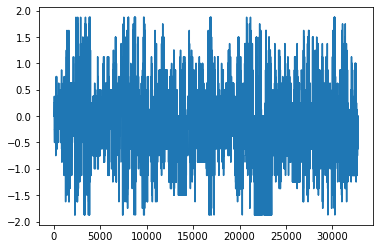

In [591]:
print(len(result_list))
plt.plot(result_list)

In [592]:
len(result_list1)

32768

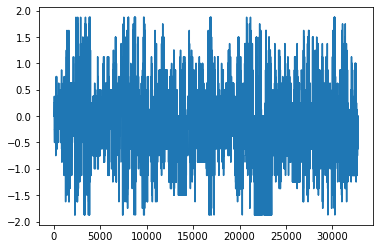

In [593]:
plt.plot(result_list1)

## First relu & pooling

In [594]:
x = F.relu(x)
x = model.pool1(x)
print(x.shape)

torch.Size([32, 16, 16])


## Second conv

In [595]:
y = x
x = model.conv2(x)
print(x.shape)
w = model.conv2.weight
b = model.conv2.bias

y, result_list, result_list1  = conv_custom(y, w, b)

sum(x==y)

torch.Size([64, 16, 16])


  0%|                                                 | 0/64 [00:00<?, ?it/s]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

  2%|▋                                        | 1/64 [00:01<01:36,  1.54s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

  3%|█▎                                       | 2/64 [00:03<01:36,  1.56s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

  5%|█▉                                       | 3/64 [00:04<01:33,  1.53s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

  6%|██▌                                      | 4/64 [00:06<01:30,  1.51s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

  8%|███▏                                     | 5/64 [00:07<01:28,  1.51s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

  9%|███▊                                     | 6/64 [00:09<01:27,  1.51s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 11%|████▍                                    | 7/64 [00:10<01:25,  1.51s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 12%|█████▏                                   | 8/64 [00:12<01:24,  1.51s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 14%|█████▊                                   | 9/64 [00:13<01:23,  1.52s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 16%|██████▎                                 | 10/64 [00:15<01:21,  1.52s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 17%|██████▉                                 | 11/64 [00:16<01:19,  1.50s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 19%|███████▌                                | 12/64 [00:18<01:18,  1.51s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 20%|████████▏                               | 13/64 [00:19<01:21,  1.59s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 22%|████████▊                               | 14/64 [00:21<01:21,  1.63s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 23%|█████████▍                              | 15/64 [00:23<01:20,  1.64s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 25%|██████████                              | 16/64 [00:25<01:20,  1.67s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 27%|██████████▋                             | 17/64 [00:26<01:18,  1.67s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 28%|███████████▎                            | 18/64 [00:28<01:17,  1.68s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 30%|███████████▉                            | 19/64 [00:30<01:17,  1.73s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 31%|████████████▌                           | 20/64 [00:31<01:15,  1.72s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 33%|█████████████▏                          | 21/64 [00:33<01:14,  1.72s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 34%|█████████████▊                          | 22/64 [00:35<01:10,  1.69s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 36%|██████████████▍                         | 23/64 [00:36<01:08,  1.67s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 38%|███████████████                         | 24/64 [00:38<01:04,  1.62s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 39%|███████████████▋                        | 25/64 [00:39<00:59,  1.52s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 41%|████████████████▎                       | 26/64 [00:41<00:57,  1.52s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 42%|████████████████▉                       | 27/64 [00:42<00:56,  1.52s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 44%|█████████████████▌                      | 28/64 [00:44<00:54,  1.52s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 45%|██████████████████▏                     | 29/64 [00:45<00:52,  1.51s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 47%|██████████████████▊                     | 30/64 [00:47<00:51,  1.50s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 48%|███████████████████▍                    | 31/64 [00:49<00:52,  1.58s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 50%|████████████████████                    | 32/64 [00:50<00:49,  1.54s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 52%|████████████████████▋                   | 33/64 [00:51<00:47,  1.52s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 53%|█████████████████████▎                  | 34/64 [00:53<00:45,  1.51s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 55%|█████████████████████▉                  | 35/64 [00:54<00:43,  1.50s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 56%|██████████████████████▌                 | 36/64 [00:56<00:41,  1.50s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 58%|███████████████████████▏                | 37/64 [00:57<00:40,  1.50s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 59%|███████████████████████▊                | 38/64 [00:59<00:39,  1.52s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 61%|████████████████████████▍               | 39/64 [01:00<00:37,  1.50s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 62%|█████████████████████████               | 40/64 [01:02<00:36,  1.51s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 64%|█████████████████████████▋              | 41/64 [01:03<00:34,  1.50s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 66%|██████████████████████████▎             | 42/64 [01:05<00:33,  1.50s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 67%|██████████████████████████▉             | 43/64 [01:06<00:31,  1.49s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 69%|███████████████████████████▌            | 44/64 [01:08<00:29,  1.49s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 70%|████████████████████████████▏           | 45/64 [01:09<00:28,  1.49s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 72%|████████████████████████████▊           | 46/64 [01:11<00:26,  1.50s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 73%|█████████████████████████████▍          | 47/64 [01:12<00:25,  1.48s/it]


torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size(

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 75%|██████████████████████████████          | 48/64 [01:14<00:23,  1.47s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 77%|██████████████████████████████▋         | 49/64 [01:15<00:22,  1.48s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 78%|███████████████████████████████▎        | 50/64 [01:17<00:20,  1.47s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 80%|███████████████████████████████▉        | 51/64 [01:18<00:19,  1.47s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 81%|████████████████████████████████▌       | 52/64 [01:20<00:17,  1.47s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 83%|█████████████████████████████████▏      | 53/64 [01:21<00:16,  1.47s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 84%|█████████████████████████████████▊      | 54/64 [01:23<00:14,  1.47s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 86%|██████████████████████████████████▍     | 55/64 [01:24<00:13,  1.48s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 88%|███████████████████████████████████     | 56/64 [01:26<00:11,  1.46s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 89%|███████████████████████████████████▋    | 57/64 [01:27<00:10,  1.47s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 91%|████████████████████████████████████▎   | 58/64 [01:28<00:08,  1.47s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 92%|████████████████████████████████████▉   | 59/64 [01:30<00:07,  1.46s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 94%|█████████████████████████████████████▌  | 60/64 [01:31<00:05,  1.46s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 95%|██████████████████████████████████████▏ | 61/64 [01:33<00:04,  1.46s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 97%|██████████████████████████████████████▊ | 62/64 [01:34<00:02,  1.47s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

 98%|███████████████████████████████████████▍| 63/64 [01:36<00:01,  1.47s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

100%|████████████████████████████████████████| 64/64 [01:37<00:00,  1.53s/it]

torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([3, 3])
torch.Size([

tensor([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0,  0,  2,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  0,  1],
        [ 1,  0,  2,  2,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1],
        [ 1,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 1,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 1,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 1,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  4,  0,  0],
        [ 1,  0,  1, 21,  2,  0,  0,  0,  0,  0,  0,  1, 10, 11,  0,  0],
        [ 1,  0,  1, 48, 48,  0,  0,  0,  0,  0,  0,  0,  0, 11,  0,  0],
        [ 1,  0,  1, 48, 48,  1,  0,  0,  0,  0,  0,  0,  0, 11,  0,  0],
        [ 1,  0,  1,  3,  0,  0,  0,  0,  0,  0,  0,  0,  0, 11,  0,  0],
        [ 1,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0, 11,  0,  0],
        [ 1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0, 11, 11,  0,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  

524288


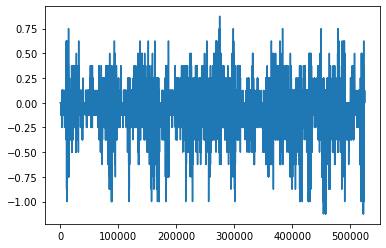

In [567]:
print(len(result_list))
plt.plot(result_list)

16384


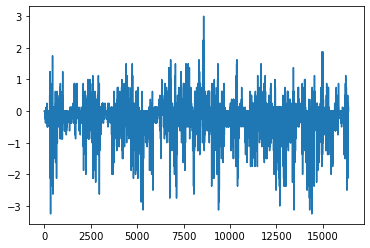

In [568]:
print(len(result_list1))
plt.plot(result_list1)

## Second relu & pooling

In [569]:
x = F.relu(x)
x = model.pool2(x)
print(x.shape)

torch.Size([64, 8, 8])


## Thrid conv

In [570]:
y = x
x = model.conv3(x)
print(x.shape)
w = model.conv3.weight
b = model.conv3.bias

y, result_list, result_list1 = conv_custom(y, w, b)

sum(x==y)

torch.Size([128, 8, 8])


100%|██████████████████████████████████████| 128/128 [00:19<00:00,  6.68it/s]


tensor([[0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0]])

524288


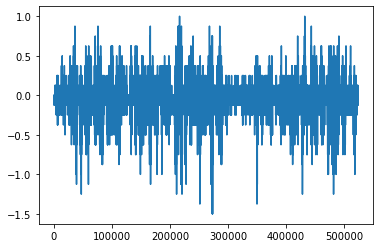

In [571]:
print(len(result_list))
plt.plot(result_list)

8192


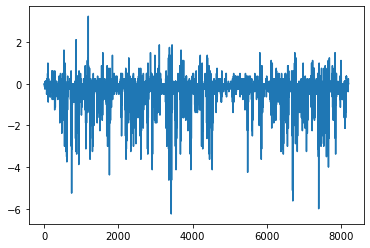

In [572]:
print(len(result_list1))
plt.plot(result_list1)

## Thrid relu & pooling

In [573]:
x = F.relu(x)
x = model.pool3(x)
print(x.shape)

torch.Size([128, 4, 4])


## Fourth conv

In [574]:
y = x
x = model.conv4(x)
print(x.shape)

w = model.conv4.weight
b = model.conv4.bias

y, result_list, result_list1 = conv_custom(y, w, b)

sum(x==y)

torch.Size([256, 4, 4])


100%|██████████████████████████████████████| 256/256 [00:19<00:00, 13.17it/s]


tensor([[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]])

524288
tensor(0.625) tensor(-1.500)


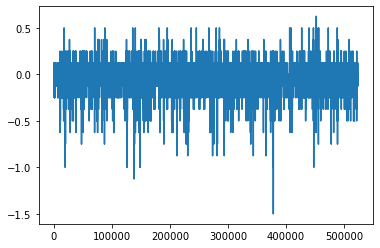

In [575]:
print(len(result_list))
print(max(result_list), min(result_list))
plt.plot(result_list)

4096


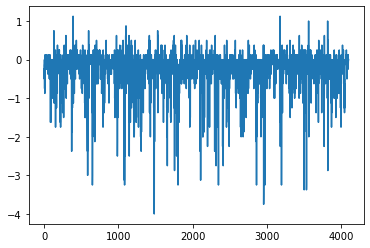

In [576]:
print(len(result_list1))
plt.plot(result_list1)

## Fourth relu & pooling

In [577]:
x = F.relu(x)
x = model.pool4(x)
print(x.shape)

torch.Size([256, 2, 2])


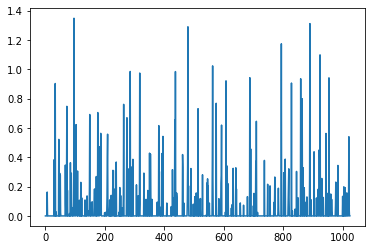

In [578]:
plt.plot(x.flatten())

## Reshape 

In [579]:
x = x.view(1,-1)
print(x.shape)

torch.Size([1, 1024])


## First fc

In [447]:
y = x
x = model.fc5(x)
print(x.shape)

w = model.fc5.weight
b = model.fc5.bias

y = fc(y, w, b)

torch.Size([1, 32])


In [448]:
x = F.relu(x)
print(x.shape)

torch.Size([1, 32])


## Second fc

In [449]:
y = x
x = model.fc6(x)
print(x.shape)

w = model.fc6.weight
b = model.fc6.bias

y = fc(y, w, b)

torch.Size([1, 10])


In [450]:
index_min1 = np.argmax(x.detach().numpy())
index_min2 = np.argmax(y.detach().numpy())

print(index_min1 == index_min2)

True


# Test

In [356]:
print("mnist dataset")
with open("./data_quantized/quant_test_data_mnist.pkl","rb") as f:
    data_list = pickle.load(f)
with open("./data_quantized/quant_test_label_mnist.pkl","rb") as g:
    label_list = pickle.load(g)

mnist dataset


In [357]:
import torchplot as plt

In [358]:
w1 = model.conv1.weight
b1 = model.conv1.bias

w2 = model.conv2.weight
b2 = model.conv2.bias

w3 = model.conv3.weight
b3 = model.conv3.bias

w4 = model.conv4.weight
b4 = model.conv4.bias

w5 = model.fc5.weight
b5 = model.fc5.bias

w6 = model.fc6.weight
b6 = model.fc6.bias

## Test with normal torch function

In [384]:
correct = 0
for i in range(10000):
    y = label_list[i]
    x_original = data_list[i].view(1,32,32)

    x = x_original
    x = model.conv1(x)
    x = quant_signed_15(x)
    #print(x.max(),x.min())
    x = model.pool1(F.relu(x))

    x = model.conv2(x)
    x = quant_signed_15(x)
    #print(x.max(),x.min())
    x = model.pool2(F.relu(x))

    x = model.conv3(x)
    x = quant_signed_15(x)
    #print(x.max(),x.min())
    x = model.pool3(F.relu(x))
    

    x = model.conv4(x)
    x = quant_signed_15(x)
    #print(x.max(),x.min())
    x = model.pool4(F.relu(x))

    x = x.view(1,-1)

    x = model.fc5(x)
    x = quant_signed_15(x)
    #print(x.max(),x.min())
    x = F.relu(x)

    x = model.fc6(x)

    index_min1 = np.argmax(x.detach().numpy())
    if (index_min1 == y.item()):
        correct = correct + 1
print(100*(correct/(i+1)))

99.22


## Test with custom function w/o JIT

In [16]:
for i in range(10):
    y = label_list[i]
    x_original = data_list[i].view(1,32,32)


    y = x

    x = x_original
    x = conv_custom(x,w1,b1)
    x = model.pool1(F.relu(x))

    x = conv_custom(x,w2,b2)
    x = model.pool2(F.relu(x))

    x = conv_custom(x,w3,b3)
    x = model.pool3(F.relu(x))

    x = conv_custom(x,w4,b4)
    x = model.pool4(F.relu(x))

    x = x.view(1,-1)

    x = fc(x,w5,b5)
    x = F.relu(x)

    x = fc(x,w6,b6)

    index_min2 = np.argmax(y.detach().numpy())
    if (index_min1 == y.item()):
        correct = correct + 1
print(100*(correct/(i+1)))

100%|████████████████████████████████████████████████████████████████████████████████| 256/256 [00:18<00:00, 13.67it/s]


NameError: name 'fc' is not defined

## Test with custom function @jit

In [380]:
w1 = model.conv1.weight
b1 = model.conv1.bias

w2 = model.conv2.weight
b2 = model.conv2.bias

w3 = model.conv3.weight
b3 = model.conv3.bias

w4 = model.conv4.weight
b4 = model.conv4.bias

w5 = model.fc5.weight
b5 = model.fc5.bias

w6 = model.fc6.weight
b6 = model.fc6.bias

w1 = w1.data.numpy()
b1 = b1.data.numpy()

w2 = w2.data.numpy()
b2 = b2.data.numpy()

w3 = w3.data.numpy()
b3 = b3.data.numpy()

w4 = w4.data.numpy()
b4 = b4.data.numpy()

In [382]:
for i in range(1000):
    y = label_list[i]
    x_original = data_list[i].view(1,32,32).numpy()


    x = x_original
    x = padding(x)
    x = conv_custom_fa(x,w1,b1)
    x = maxpooling(x)
    x = reul(x)

    x = padding(x)
    x = conv_custom_fa(x,w2,b2)
    x = maxpooling(x)
    x = reul(x)

    x = padding(x)
    x = conv_custom_fa(x,w3,b3)
    x = maxpooling(x)
    x = reul(x)

    x = padding(x)
    x = conv_custom_fa(x,w4,b4)
    x = maxpooling(x)
    x = reul(x)



